# Piecewise Quantile Regression Model (PQRM) - Module Testing

This notebook demonstrates the usage of the newly created `piecewise_quantile_regression` module.

## Contents
1. Load and prepare data
2. Basic PQRM fitting
3. Bootstrap inference for confidence intervals
4. Complete pipeline usage
5. Multiple quantile comparison
6. Using the PiecewiseQuantileRegression class

In [1]:
# Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
from pathlib import Path

# Add src to path
project_root = Path.cwd().parent
sys.path.insert(0, str(project_root / 'src'))

# Import the PQRM module
from zci.piecewise_quantile_regression import (
    pqrm_analysis_pipeline,
    fit_pqrm_pipeline,
    bootstrap_pqrm_inference,
    fit_multiple_quantiles,
    PiecewiseQuantileRegression,
    plot_pqrm_fit,
    plot_pqrm_with_bootstrap_ci,
    plot_multiple_quantiles
)

print("✓ Modules imported successfully!")

✓ Modules imported successfully!


## 1. Load and Prepare Data

We'll load the simulation data from notebook 06 to test our module.

In [2]:
# Load the simulation data (adjust path as needed)
data_path = project_root / 'data' / 'interim'

# If simulation data exists, load it
# Otherwise, create synthetic data for testing
try:
    simulation_data = pd.read_csv(data_path / 'simulation_data.csv')
    print("✓ Loaded existing simulation data")
    print(f"Data shape: {simulation_data.shape}")
    print(f"Available configurations: {simulation_data['(n, df)'].unique()}")
except FileNotFoundError:
    print("Creating synthetic data for testing...")
    
    # Generate synthetic piecewise data
    np.random.seed(42)
    n = 150
    
    x = np.random.uniform(0, 1, n)
    
    # Piecewise linear relationship with breakpoints at 0.3 and 0.6
    y = np.zeros(n)
    y[x <= 0.3] = 0.5 + 1.0 * x[x <= 0.3]
    y[(x > 0.3) & (x <= 0.6)] = 0.8 + 2.0 * (x[(x > 0.3) & (x <= 0.6)] - 0.3)
    y[x > 0.6] = 1.4 + 0.5 * (x[x > 0.6] - 0.6)
    
    # Add heteroscedastic noise
    noise = np.random.normal(0, 0.1 + 0.1 * x, n)
    y_continuous = y + noise
    
    simulation_data = pd.DataFrame({
        'x': x,
        'y_continuous': y_continuous,
        '(n, df)': '(150, 20)'
    })
    
    print("✓ Created synthetic data")
    print(f"Data shape: {simulation_data.shape}")

# Display first few rows
simulation_data.head()

Creating synthetic data for testing...
✓ Created synthetic data
Data shape: (150, 3)


,x,y_continuous,"(n, df)"
0,0.374540,0.922639,"(150, 20)"
1,0.950714,1.634180,"(150, 20)"
2,0.731994,1.459985,"(150, 20)"
3,0.598658,1.210485,"(150, 20)"
4,0.156019,0.788131,"(150, 20)"


Test dataset size: 150
X range: [0.006, 0.987]
Y range: [0.211, 2.016]


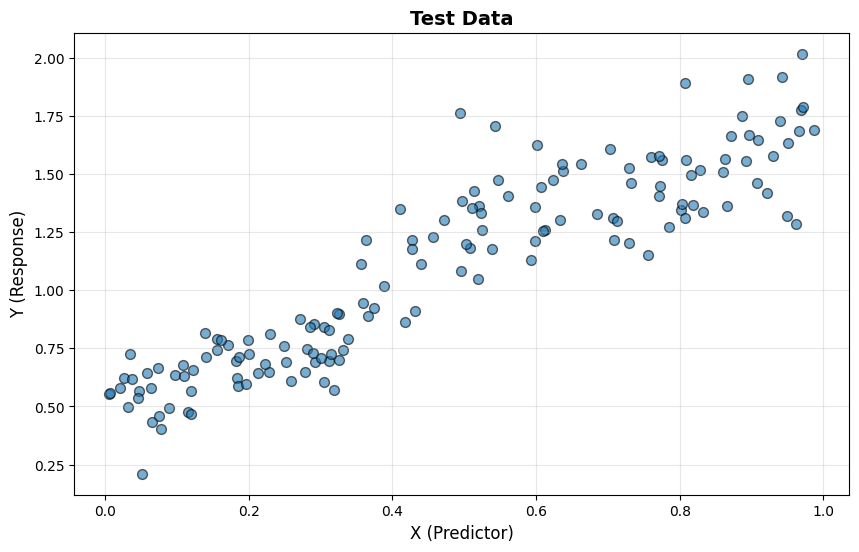

In [3]:
# Select a specific dataset configuration for testing
df_test = simulation_data[simulation_data['(n, df)'] == simulation_data['(n, df)'].iloc[0]].copy()

print(f"Test dataset size: {len(df_test)}")
print(f"X range: [{df_test['x'].min():.3f}, {df_test['x'].max():.3f}]")
print(f"Y range: [{df_test['y_continuous'].min():.3f}, {df_test['y_continuous'].max():.3f}]")

# Quick visualization of the data
plt.figure(figsize=(10, 6))
plt.scatter(df_test['x'], df_test['y_continuous'], alpha=0.6, s=50, edgecolor='black')
plt.xlabel('X (Predictor)', fontsize=12)
plt.ylabel('Y (Response)', fontsize=12)
plt.title('Test Data', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.show()

## 2. Basic PQRM Fitting

Let's start with the core fitting function without bootstrap.

In [ ]:
# Fit a basic PQRM model
fitted_model, breakpoints, data_with_breaks = fit_pqrm_pipeline(
    data=df_test,
    x_col='x',
    y_col='y_continuous',
    tau=0.5,  # Median regression
    max_breakpoints=2,
    initial_guess=[0.3, 0.6],  # Provide initial guess
    bounds=[(0.2, 0.4), (0.5, 0.7)],  # Constrain search
    max_iter=5000,
    verbose=True,
)

print("\n" + "="*50)
print(f"Estimated breakpoints: {breakpoints}")
print("="*50)

Optimizing 2 breakpoints...
Initial guess: [0.3 0.6]
Optimal breakpoints: [0.31435598 0.5       ]
Optimization success: True
Final loss: 8.6318

Estimated breakpoints: [0.31435598 0.5       ]


In [30]:
import statsmodels.formula.api as smf

model = smf.quantreg("y_continuous ~ x", data=df_test, cov_type = "robust")
model

/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/base/model.py:130: ValueWarning: unknown kwargs ['cov_type']
  warnings.warn(msg, ValueWarning)


In [ ]:
#  TO DO: make CI for predictions of X-grid based on the CI for coefficients

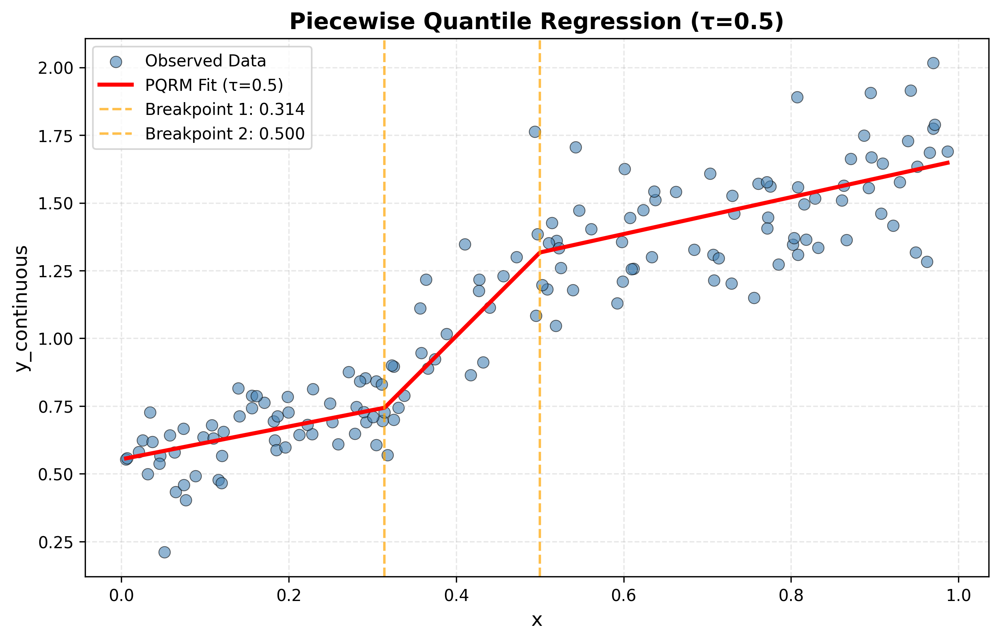

In [5]:
# Visualize the fitted model
fig, ax = plot_pqrm_fit(
    data=data_with_breaks,
    fitted_model=fitted_model,
    breakpoints=breakpoints,
    x_col='x',
    y_col='y_continuous',
    tau=0.5,
    show_breakpoints=True
)
plt.show()

In [6]:
# Check model summary
print(fitted_model.summary())

                         QuantReg Regression Results                          
Dep. Variable:           y_continuous   Pseudo R-squared:               0.6911
Model:                       QuantReg   Bandwidth:                      0.1346
Method:                 Least Squares   Sparsity:                       0.3776
Date:                Wed, 14 Jan 2026   No. Observations:                  150
Time:                        21:48:07   Df Residuals:                      146
                                        Df Model:                            3
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.5536      0.048     11.649      0.000       0.460       0.648
x              0.6050      0.225      2.688      0.008       0.160       1.050
x_break1       2.4825      0.473      5.246      0.000       1.547       3.418
x_break2      -2.4076      0.403     -5.973      0.0

## 3. Bootstrap Inference

Now let's add bootstrap inference to quantify uncertainty.

In [7]:
# Perform bootstrap inference
bootstrap_results = bootstrap_pqrm_inference(
    fitted_model=fitted_model,
    data_with_breaks=data_with_breaks,
    x_col='x',
    y_col='y_continuous',
    tau=0.5,
    max_breakpoints=2,
    n_bootstrap=100,  # Use 100 for quick testing
    confidence_level=0.95,
    initial_guess=[0.3, 0.6],
    bounds=[(0.2, 0.4), (0.5, 0.7)],
    max_iter=5000,
    use_bias_correction=True,
    random_state=42,
    verbose=True
)

print("\n" + "="*50)
print("Bootstrap Results:")
print(f"Successful iterations: {bootstrap_results['n_bootstrap']}")
print(f"Breakpoint CIs:")
for i, (lower, upper) in enumerate(bootstrap_results['breakpoint_ci']):
    print(f"  Breakpoint {i+1}: [{lower:.4f}, {upper:.4f}]")
print("="*50)

Starting bootstrap inference with 100 iterations...
  Completed 20/100 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regres

  Completed 40/100 iterations
  Completed 60/100 iterations
  Completed 80/100 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (5000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +


  Completed 100/100 iterations
Bootstrap inference complete. Successful: 100/100

Bootstrap Results:
Successful iterations: 100
Breakpoint CIs:
  Breakpoint 1: [0.2150, 0.3946]
  Breakpoint 2: [0.5000, 0.6218]


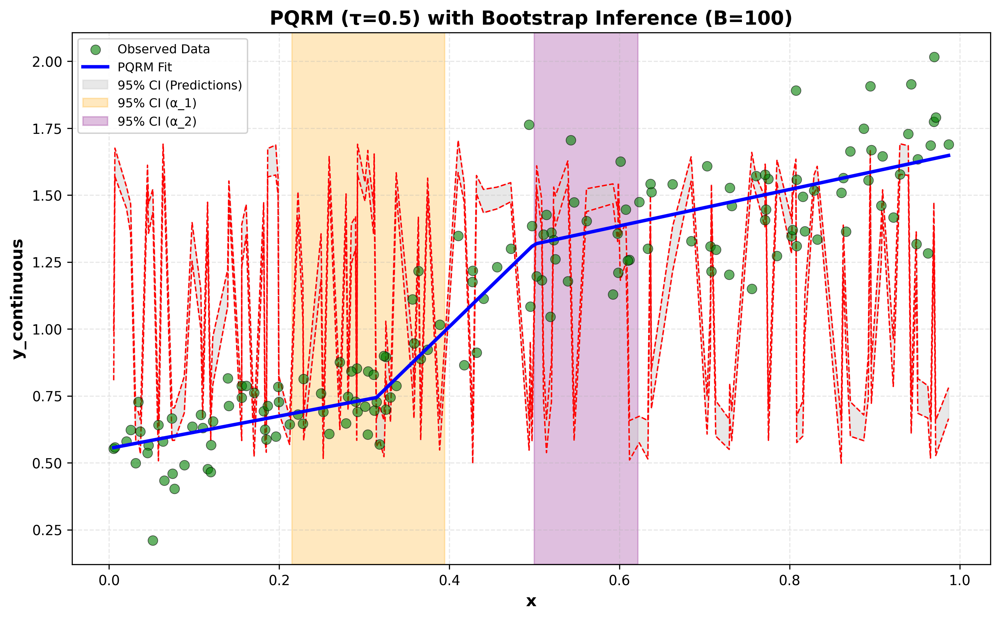

In [8]:
# Visualize with bootstrap confidence intervals
fig, ax = plot_pqrm_with_bootstrap_ci(
    data=df_test,
    data_with_breaks=data_with_breaks,
    fitted_model=fitted_model,
    breakpoints=breakpoints,
    bootstrap_results=bootstrap_results,
    x_col='x',
    y_col='y_continuous',
    tau=0.5,
    show_breakpoint_ci=True
)
plt.show()

## 4. Complete Pipeline Usage

The easiest way to use the module is through the high-level pipeline function.

PQRM Analysis Pipeline
Configuration:
  - Quantile level (τ): 0.5
  - Number of breakpoints: 2
  - Bootstrap inference: True
  - Bootstrap iterations: 500
  - Confidence level: 0.8

Step 1: Fitting base PQRM model...
Optimizing 2 breakpoints...
Initial guess: [0.3 0.6]


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

Optimal breakpoints: [0.31435598 0.5       ]
Optimization success: True
Final loss: 8.6318
  ✓ Model fitted successfully
  ✓ Estimated breakpoints: [0.31435598 0.5       ]

Step 2: Performing bootstrap inference (500 iterations)...
Starting bootstrap inference with 500 iterations...


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 20/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 40/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 60/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 80/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 100/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 120/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 140/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 160/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 180/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 200/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 220/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 240/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 260/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 280/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 300/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 320/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 340/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 360/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 380/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 400/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 420/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 440/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 460/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 480/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

  Completed 500/500 iterations


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (100) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regressio

Bootstrap inference complete. Successful: 500/500
  ✓ Bootstrap completed: 500/500 successful

Step 3: Creating visualizations...
  ✓ Main plot created
  ✓ Residual diagnostics created

Pipeline completed successfully!
Results summary:
  - Breakpoints: [0.31435598 0.5       ]
  - Bootstrap iterations: 500
  - Breakpoint CIs: [(0.2615637726628331, 0.35254220318939944), (0.5, 0.5705744145657132)]
  - Figures created: ['main_plot', 'residuals']


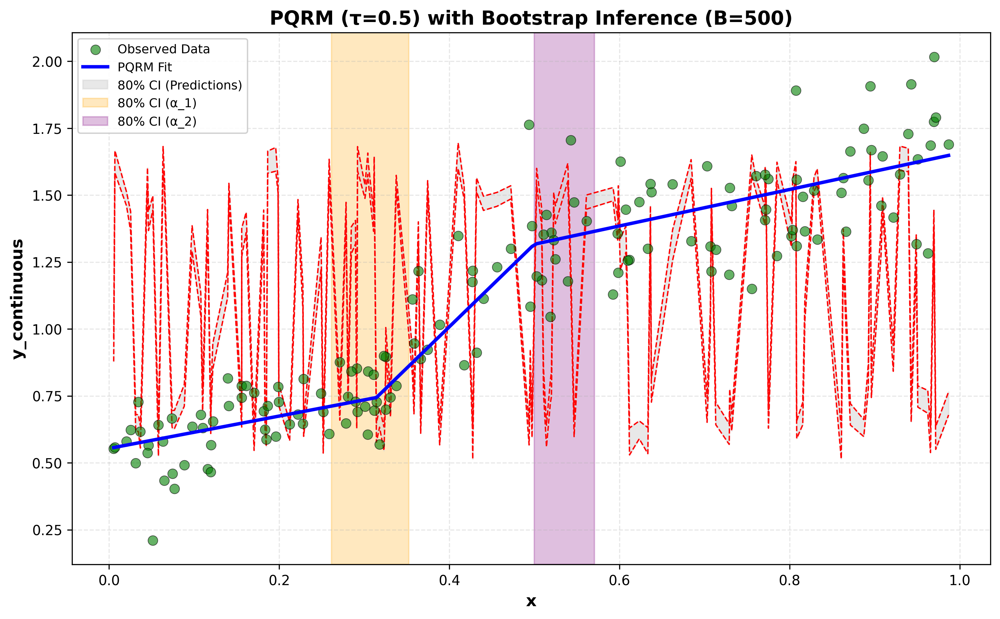

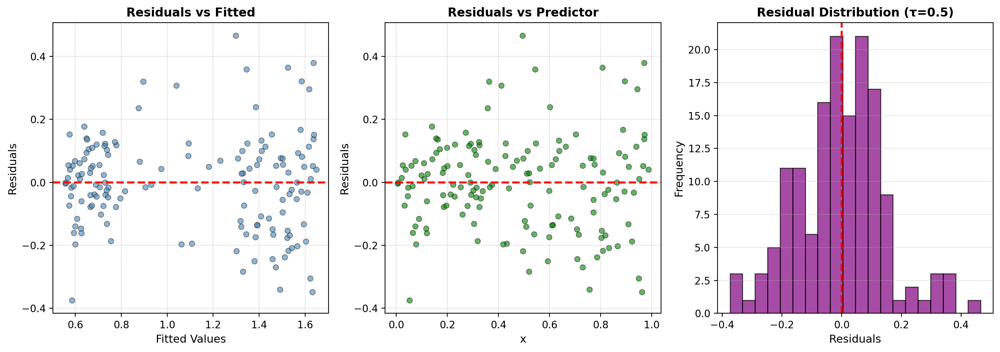

In [24]:
# Run the complete pipeline
results = pqrm_analysis_pipeline(
    data=df_test,
    x_col='x',
    y_col='y_continuous',
    tau=0.5,
    max_breakpoints=2,
    initial_guess=[0.3, 0.6],
    bounds=[(0.2, 0.4), (0.5, 0.7)],
    max_iter=100,
    run_bootstrap=True,
    n_bootstrap=500,
    confidence_level=0.80,
    use_bias_correction=True,
    create_visualizations=True,
    show_residuals=True,
    verbose=True,
    random_state=42
)

In [11]:
# Display the main plot
results['figures']['main_plot'].show()

/var/folders/s5/r1s56_ps46lbbv1370hjn_vr0000gn/T/ipykernel_65225/2490822509.py:2: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  results['figures']['main_plot'].show()


In [12]:
# Display residual diagnostics
results['figures']['residuals'].show()

/var/folders/s5/r1s56_ps46lbbv1370hjn_vr0000gn/T/ipykernel_65225/3892800175.py:2: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  results['figures']['residuals'].show()


In [13]:
# Access results
print("Pipeline Results:")
print(f"Breakpoints: {results['breakpoints']}")
print(f"Breakpoint CIs: {results['breakpoint_ci']}")
print(f"Successful bootstrap iterations: {results['n_bootstrap']}")

Pipeline Results:
Breakpoints: [0.31435598 0.5       ]
Breakpoint CIs: [(0.2708681811757847, 0.3589821154464482), (0.5, 0.5661690656794629)]
Successful bootstrap iterations: 50


## 5. Multiple Quantile Comparison

Fit PQRM for different quantile levels to understand the full conditional distribution.

In [14]:
# Fit multiple quantiles
multi_results = fit_multiple_quantiles(
    data=df_test,
    x_col='x',
    y_col='y_continuous',
    taus=[0.1, 0.25, 0.5, 0.75, 0.9],
    max_breakpoints=2,
    initial_guess=[0.3, 0.6],
    bounds=[(0.2, 0.4), (0.5, 0.7)],
    max_iter=5000,
    verbose=True
)

Fitting PQRM for 5 quantile levels...

[1/5] Fitting τ=0.1
  Breakpoints: [0.30424224 0.60754875]

[2/5] Fitting τ=0.25
  Breakpoints: [0.31732975 0.5       ]

[3/5] Fitting τ=0.5
  Breakpoints: [0.31435598 0.5       ]

[4/5] Fitting τ=0.75
  Breakpoints: [0.31171107 0.5       ]

[5/5] Fitting τ=0.9
  Breakpoints: [0.25867358 0.5       ]

All quantiles fitted successfully!


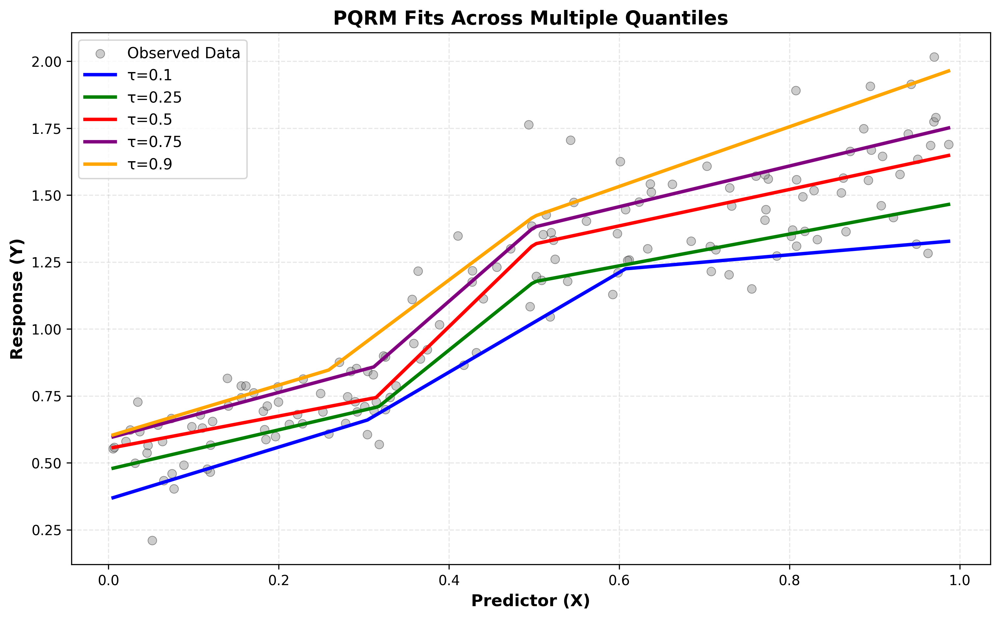

In [15]:
# Prepare data for visualization
models_dict = {
    tau: (res['model'], res['breakpoints'], res['data_with_breaks'])
    for tau, res in multi_results.items()
}

# Visualize all quantiles
fig, ax = plot_multiple_quantiles(
    data=df_test,
    models_dict=models_dict,
    x_col='x',
    y_col='y_continuous',
    xlabel='Predictor (X)',
    ylabel='Response (Y)',
    title='PQRM Fits Across Multiple Quantiles'
)
plt.show()

In [16]:
# Compare breakpoints across quantiles
from zci.piecewise_quantile_regression import compare_quantile_breakpoints

comparison_df = compare_quantile_breakpoints(multi_results)
print("\nBreakpoint Comparison Across Quantiles:")
print(comparison_df)


Breakpoint Comparison Across Quantiles:
    tau  breakpoint_1  breakpoint_2
0  0.10      0.304242      0.607549
1  0.25      0.317330      0.500000
2  0.50      0.314356      0.500000
3  0.75      0.311711      0.500000
4  0.90      0.258674      0.500000


## 6. Using the PiecewiseQuantileRegression Class

The scikit-learn style class interface provides a familiar API.

In [17]:
# Create a PQRM instance
pqrm = PiecewiseQuantileRegression(
    tau=0.5,
    max_breakpoints=2,
    initial_guess=[0.3, 0.6],
    bounds=[(0.2, 0.4), (0.5, 0.7)],
    max_iter=5000,
    verbose=True
)

# Fit the model
pqrm.fit(df_test, x_col='x', y_col='y_continuous')

print(f"\nFitted breakpoints: {pqrm.breakpoints_}")

Optimizing 2 breakpoints...
Initial guess: [0.3 0.6]
Optimal breakpoints: [0.31435598 0.5       ]
Optimization success: True
Final loss: 8.6318

Fitted breakpoints: [0.31435598 0.5       ]


In [18]:
# Make predictions
predictions = pqrm.predict(df_test)

print(f"Predictions shape: {predictions.shape}")
print(f"First 5 predictions: {predictions[:5]}")

Predictions shape: (150,)
First 5 predictions: [0.92958603 1.62338433 1.47467423 1.38401816 0.64798169]


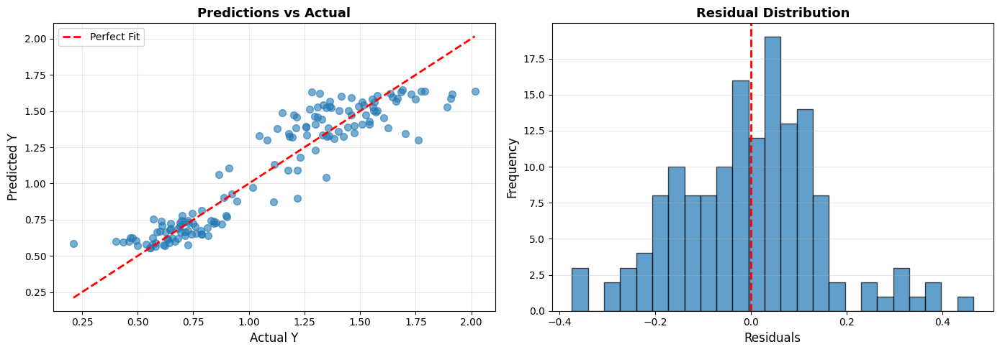

In [19]:
# Get residuals
residuals = pqrm.get_residuals()

# Plot predictions vs actual
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Predictions vs actual
axes[0].scatter(df_test['y_continuous'], predictions, alpha=0.6, s=50)
axes[0].plot([df_test['y_continuous'].min(), df_test['y_continuous'].max()],
             [df_test['y_continuous'].min(), df_test['y_continuous'].max()],
             'r--', lw=2, label='Perfect Fit')
axes[0].set_xlabel('Actual Y', fontsize=12)
axes[0].set_ylabel('Predicted Y', fontsize=12)
axes[0].set_title('Predictions vs Actual', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Residual distribution
axes[1].hist(residuals, bins=25, alpha=0.7, edgecolor='black')
axes[1].axvline(0, color='red', linestyle='--', lw=2)
axes[1].set_xlabel('Residuals', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('Residual Distribution', fontsize=13, fontweight='bold')
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

In [20]:
# Display model summary
print(pqrm.summary())

                         QuantReg Regression Results                          
Dep. Variable:           y_continuous   Pseudo R-squared:               0.6911
Model:                       QuantReg   Bandwidth:                      0.1346
Method:                 Least Squares   Sparsity:                       0.3776
Date:                Wed, 14 Jan 2026   No. Observations:                  150
Time:                        21:57:49   Df Residuals:                      146
                                        Df Model:                            3
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.5536      0.048     11.649      0.000       0.460       0.648
x              0.6050      0.225      2.688      0.008       0.160       1.050
x_break1       2.4825      0.473      5.246      0.000       1.547       3.418
x_break2      -2.4076      0.403     -5.973      0.0

## 7. Test with Different Quantiles and Settings

Let's test the module with different configurations.

10th Percentile - Breakpoints: [0.30424224 0.60754875]


/var/folders/s5/r1s56_ps46lbbv1370hjn_vr0000gn/T/ipykernel_65225/1440778059.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  results_10th['figures']['main_plot'].show()


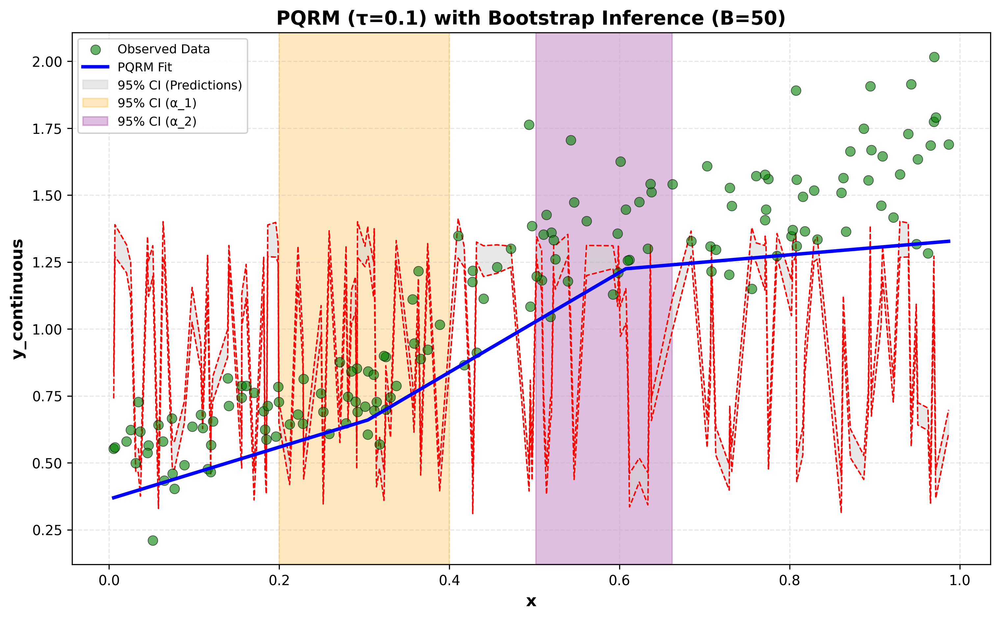

In [21]:
# Test with 10th percentile (lower tail)
results_10th = pqrm_analysis_pipeline(
    data=df_test,
    tau=0.1,
    max_breakpoints=2,
    initial_guess=[0.3, 0.6],
    bounds=[(0.2, 0.4), (0.5, 0.7)],
    run_bootstrap=True,
    n_bootstrap=50,  # Fewer iterations for speed
    create_visualizations=True,
    verbose=False,
    random_state=42
)

print(f"10th Percentile - Breakpoints: {results_10th['breakpoints']}")
results_10th['figures']['main_plot'].show()

90th Percentile - Breakpoints: [0.25867358 0.5       ]


/var/folders/s5/r1s56_ps46lbbv1370hjn_vr0000gn/T/ipykernel_65225/2155182705.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  results_90th['figures']['main_plot'].show()


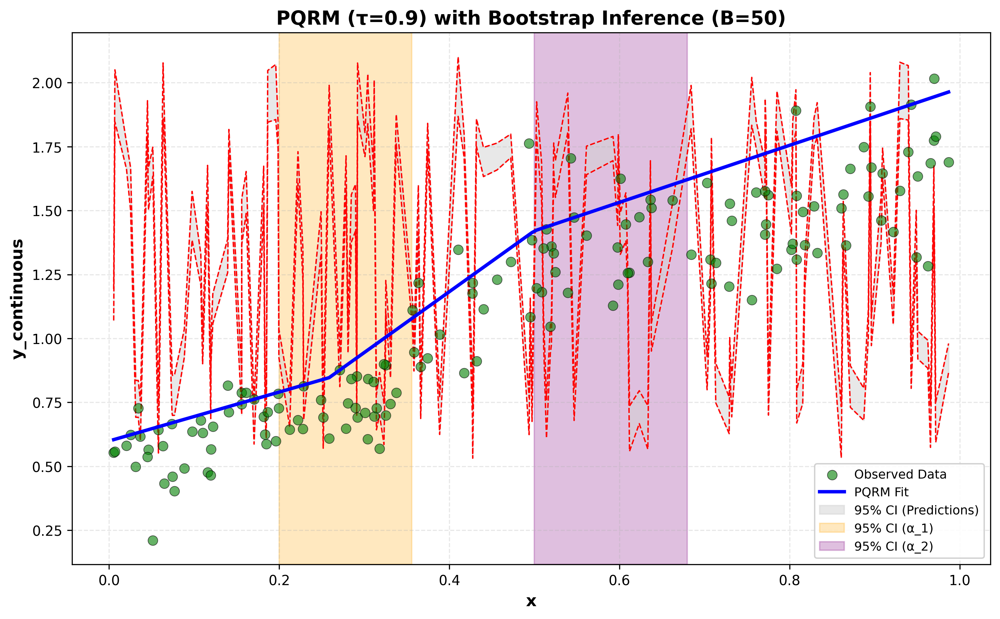

In [22]:
# Test with 90th percentile (upper tail)
results_90th = pqrm_analysis_pipeline(
    data=df_test,
    tau=0.9,
    max_breakpoints=2,
    initial_guess=[0.3, 0.6],
    bounds=[(0.2, 0.4), (0.5, 0.7)],
    run_bootstrap=True,
    n_bootstrap=50,
    create_visualizations=True,
    verbose=False,
    random_state=42
)

print(f"90th Percentile - Breakpoints: {results_90th['breakpoints']}")
results_90th['figures']['main_plot'].show()